---
Đề tài : Phân tích giá thuê nhà ứng dụng các phương pháp thống kê và các mô hình máy học
___


# Ngữ cảnh và yêu cầu

Giá cho thuê căn hộ ở Mỹ biến động theo diện tích căn hộ, địa điểm và một số tiện ích khác. Dữ liệu
[apartments_for_data100k_classified_10K.csv](https://drive.google.com/file/d/1-PxhoqJYXR7kTG93zMNEolResiHYf1IS/view?usp=drive_link) chứa thông tin của 100,000 căn hộ cho thuê tại Mỹ. Với các
biến như sau:

* `id` = Mã định danh cho từng căn chung cư
* `category` = Danh mục phân loại
* `title` = Tiêu đề mô tả căn hộ
* `body` = Mô tả chi tiết căn hộ
* `amenities` = Tiện nghi căn hộ kèm theo như máy lạnh, sân bóng rổ, truyền hình cáp, phòng gym, internet, hồ bơi, tủ lạnh, ...
* `bathrooms` = số phòng tắm
* `bedrooms` = số phòng ngủ
* `currency` = loại tiền tệ
* `fee` = phí
* `has_photo` = hình ảnh căn hộ
* `pets_allowed` = Các loại thú cưng được phép nuôi như chó, mèo, v.v.
* `price` = giá thuê của căn hộ
* `price_display` = giá hiển thị
* `price_type` = kỳ hạn thanh toán
* `square_feet` = diện tích căn hộ
* `address` = địa chỉ cụ thể
* `cityname` = căn hộ tọa lạc tại thành phố nào
* `state` = tiểu bang căn hộ tọa lạc
* `latitude` = vĩ độ
* `longitude` = kinh độ
* `source` = Nguồn gốc của thông tin được lấy
* `time` = Thời điểm mà thông tin được lấy



Mục tiêu báo cáo : giúp người dùng hiểu rõ hơn về giá thuê căn hộ ở Mỹ dựa trên các yếu tố như diện tích, tiện ích, và vị trí địa lý.
Hãy xử lý, phân tích dữ liệu này để giúp cho người thuê nhà hoặc công ty môi giới nhà đất hiểu rõ hơn về giá thuê căn hộ theo nhu cầu sử dụng của người thuê, góp phần đề ra các căn hộ hợp lý.

#Thư viện sử dụng

In [7]:
!pip install scikit-learn==1.1.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 60.4 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.29.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.1.3 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.1.3 which is incompatible.


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
!pip install catboost
!pip install lime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8b63a4caacd50506e688426e4a114c7469d9b3c2bc50d5a1132be0e85b7bdf99
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [10]:
import pandas as pd
import numpy as np
import missingno as msno
from scipy.special import inv_boxcox
from scipy.stats import f_oneway,boxcox
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold,cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lime.lime_tabular import LimeTabularExplainer

#I.Khái quát về dữ liệu

In [5]:
data100k = pd.read_csv('/content/drive/MyDrive/PythonForDataScience/apartments_for_rent_classified_100K.csv',sep=";", encoding='cp1252')


<ipython-input-5-26afde71f9f9>:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  data100k = pd.read_csv('/content/drive/MyDrive/PythonForDataScience/apartments_for_rent_classified_100K.csv',sep=";", encoding='cp1252')


##1.Xem kiểu dữ liệu của từng trường và rà soát dữ liệu khuyết của bộ dữ liệu

In [6]:
data100k.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             99492 non-null  int64  
 1   category       99492 non-null  object 
 2   title          99492 non-null  object 
 3   body           99492 non-null  object 
 4   amenities      83448 non-null  object 
 5   bathrooms      99429 non-null  float64
 6   bedrooms       99368 non-null  float64
 7   currency       99492 non-null  object 
 8   fee            99492 non-null  object 
 9   has_photo      99492 non-null  object 
 10  pets_allowed   39068 non-null  object 
 11  price          99491 non-null  float64
 12  price_display  99491 non-null  object 
 13  price_type     99492 non-null  object 
 14  square_feet    99492 non-null  int64  
 15  address        7943 non-null   object 
 16  cityname       99190 non-null  object 
 17  state          99190 non-null  object 
 18  latitu

In [7]:
data100k.isnull().sum()

,0
id,0
category,0
title,0
body,0
amenities,16044
bathrooms,63
bedrooms,124
currency,0
fee,0
has_photo,0


##2.Xem các biến định lượng và định tính mang thông tin gì

In [8]:
data100k.describe(include="object")

,category,title,body,amenities,currency,fee,has_photo,pets_allowed,price_display,price_type,address,cityname,state,source
count,99492,99492,99492,83448,99492,99492,99492,39068,99491,99492,7943,99190,99190,99492
unique,7,58503,94503,9827,1,2,3,4,3718,3,7771,2979,51,25
top,housing/rent/apartment,Apartment in great location,"When searching for a pet-friendly One-, Two- a...",Parking,USD,No,Yes,"Cats,Dogs","$1,350",Monthly,8215 S.W 72nd Avenue,Dallas,TX,RentDigs.com
freq,99431,1064,43,6188,99492,99291,55974,37097,574,99488,19,2858,11257,90912


In [9]:
data100k['body'][1]

'This unit is located at 146 Lochview Drive, Newport News, 23602, VAMonthly rental rates range from $1250We have 3 beds units available for rent'

In [10]:
data100k['title'][1]

'Three BR 146 Lochview Drive'

In [11]:
data100k.describe()

,id,bathrooms,bedrooms,price,square_feet,latitude,longitude,time
count,9.949200e+04,99429.000000,99368.000000,99491.000000,99492.000000,99467.000000,99467.000000,9.949200e+04
mean,5.358321e+09,1.445323,1.728212,1527.057281,956.430688,36.947988,-91.568656,1.559665e+09
std,1.847404e+08,0.547021,0.749200,904.245882,417.571522,4.599461,15.817168,1.105077e+07
min,5.121046e+09,1.000000,0.000000,100.000000,101.000000,19.573800,-159.369800,1.544174e+09
25%,5.197950e+09,1.000000,1.000000,1013.000000,729.000000,33.746500,-104.791900,1.550832e+09
50%,5.508673e+09,1.000000,2.000000,1350.000000,900.000000,37.228200,-84.562300,1.568745e+09
75%,5.509007e+09,2.000000,2.000000,1795.000000,1115.000000,39.953000,-77.608200,1.568767e+09
max,5.669439e+09,9.000000,9.000000,52500.000000,50000.000000,64.833200,-68.778800,1.577391e+09


Kết luận : Xóa bỏ các cột thừa, không có ý nghĩa như 'body', 'title', ...

Xác định được biến 'price' là biến mục tiêu

Xử lý các dữ liệu thiếu cho hợp lý

#II.Xử lý missing data

Xét xem kiểu dữ liệu bị khuyết là gì từ đó đưa ra phương án xử lý

<Figure size 500x300 with 0 Axes>

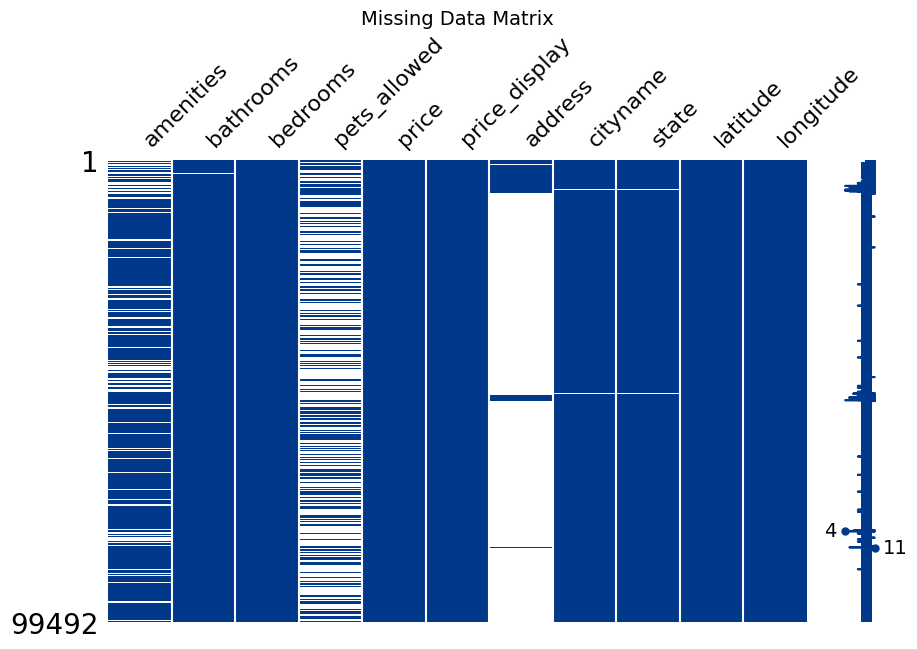

In [12]:
missing_cols = data100k.columns[data100k.isnull().any()]
plt.figure(figsize=(5, 3))
msno.matrix(data100k[missing_cols], figsize=(10, 6), color=(0.0, 0.22, 0.545))
plt.title("Missing Data Matrix", fontsize=14)
plt.show()

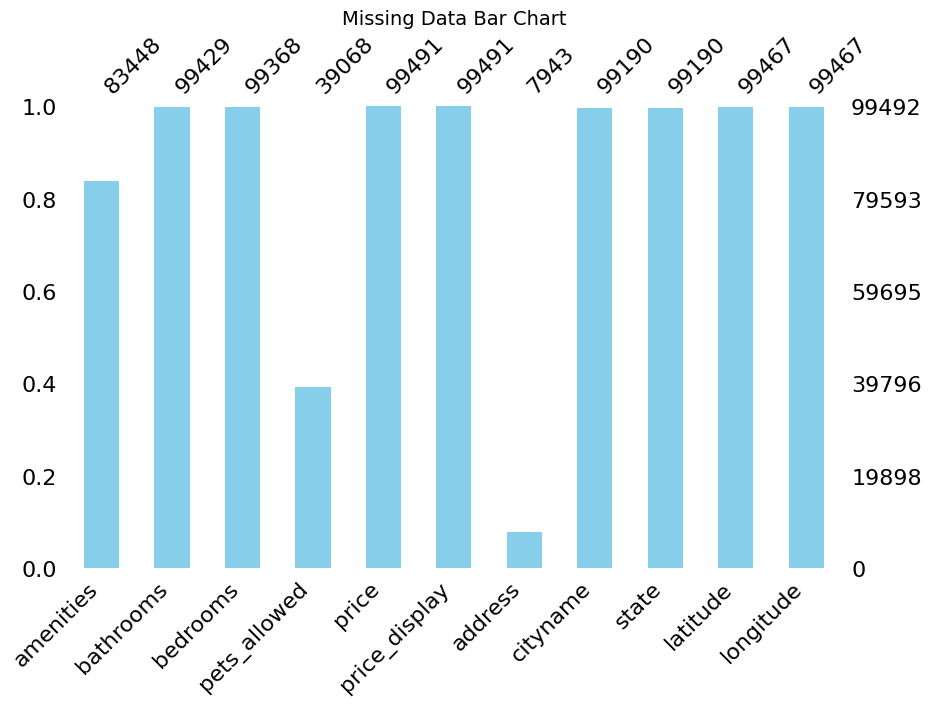

In [13]:
plt.figure(figsize=(10, 6))
msno.bar(data100k[missing_cols], figsize=(10, 6), color='skyblue')
plt.title("Missing Data Bar Chart", fontsize=14)
plt.show()

Nhận xét :
- Ta nhận thấy các dữ liệu tại các cột 'bathrooms', 'bedrooms', 'price', 'price_display', 'latitude', 'longitude', bị mất là hoàn toàn ngẫu nhiên và số lượng rất ít nên ta có thể loại bỏ

In [14]:
data100k = data100k.dropna(subset=['bathrooms', 'bedrooms', 'price', 'price_display', 'latitude', 'longitude'])

-Tại các cột khuyết tại 'city' và 'state' ta có thể khôi phục dự vào kinh độ vĩ độ ( do nhìn vào biểu độ ta thấy các nơi mà các cột dữ liệu này khuyết thì vẫn còn tồn tại kinh dộ vĩ độ

In [15]:
data100k[['cityname','state']].isna().sum()

,0
cityname,273
state,273


In [16]:
data100k.loc[data100k['cityname'].isna() | data100k['state'].isna(), ['longitude', 'latitude']].value_counts()

,,count
longitude,latitude,
-98.5576,39.8163,217
-75.9597,37.2770,16
-92.2006,37.8286,15
-78.9348,35.4164,7
-78.3960,36.3540,7
-78.1713,36.4861,4
-122.6052,38.7904,3
-78.3435,35.6032,2
-117.2430,34.2143,1


Ta có thể bỏ hoặc tra mạng hay để khôi phục

Ta sẽ thử tra trên web này
https://www.latlong.net/Show-Latitude-Longitude.html

In [17]:
location_mapping = {
    -98.5576: ('Lebanon', 'KS'),
    -75.9597: ('Cape Charles', 'VA'),
    -92.2006: ('Waynesville', 'MO'),
    -78.9348: ('Lillington', 'NC'),
    -78.3960: ('Henderson', 'NC'),
    -78.1713: (' Norlina', 'NC'),
    -122.6052: ('Middletown', 'CA'),
    -78.3435: ('Clayton', 'NC'),
    -117.2430: ('San Bernardino', 'CA'),
    -82.1971: ('Dade', 'FL')
}

for longitude, (city, state) in location_mapping.items():
    data100k.loc[((data100k['cityname'].isna()) | (data100k['state'].isna())) & (data100k['longitude'] == longitude), ['cityname', 'state']] = [city, state]

Bỏ cột dữ liệu 'address' vì nó không mang ý nghĩa và khuyết nhiều

In [18]:
data100k.drop(columns=['address'], inplace=True)

Xét 'pets_allowed' ta thấy việc dữ liệu này khuyết là do nơi này cấm nuôi nên không đề cập đến nên ta sẽ điền khuyết bằng cách đánh là không nuôi

In [19]:
data100k['pets_allowed'].value_counts()

,count
pets_allowed,
"Cats,Dogs",37047
Cats,1837
Dogs,127
"Cats,Dogs,None",1


In [20]:
data100k['pets_allowed'] = data100k['pets_allowed'].fillna('None')

Xét cột 'amenities'

In [21]:
print(data100k['amenities'].value_counts()[:15])
print('-' * 20)
print(data100k['amenities'].value_counts()[-15:])

amenities
Parking                       6179
Parking,Storage               2115
Gym,Pool                      1871
Pool                          1481
Gym,Parking,Pool              1187
Parking,Pool                   885
Washer Dryer                   838
Patio/Deck                     774
Clubhouse,Gym,Pool             759
Gym                            734
Parking,Patio/Deck,Storage     664
Wood Floors                    624
Parking,Washer Dryer           520
Gym,Patio/Deck,Pool            518
Gym,Parking,Pool,Storage       477
Name: count, dtype: int64
--------------------
amenities
Dishwasher,Fireplace,Garbage Disposal,Parking,Patio/Deck,Playground,Pool,Refrigerator                                                                     1
Cable or Satellite,Dishwasher,Elevator,Garbage Disposal,Gated,Parking,Patio/Deck,Pool,Refrigerator,Storage                                                1
Cable or Satellite,Clubhouse,Dishwasher,Doorman,Elevator,Garbage Disposal,Golf,Internet Access,P

In [22]:
from collections import Counter
def count_and_sort_phrases(data, column):
    all_phrases = []
    for row in data[column]:
      row = str(row)
      all_phrases.extend(row.split(','))
    sorted_phrase_counts = sorted(Counter(all_phrases).items(), key=lambda x: x[1], reverse=True)
    for phrase, count in sorted_phrase_counts:
        print(f"{phrase.strip()}: {count}")

count_and_sort_phrases(data100k, 'amenities')

Parking: 43764
Pool: 43459
Gym: 37253
Patio/Deck: 26476
Washer Dryer: 25935
Storage: 21561
Clubhouse: 19055
Dishwasher: 16574
nan: 15962
AC: 15745
Fireplace: 14889
Refrigerator: 14862
Cable or Satellite: 12471
Playground: 11319
Internet Access: 11025
Wood Floors: 8853
Gated: 8628
Tennis: 8462
TV: 4458
Elevator: 4303
Basketball: 4140
Hot Tub: 3990
Garbage Disposal: 3869
View: 2081
Alarm: 363
Doorman: 215
Luxury: 210
Golf: 27


Ta nhận ra các tiện nghi xuất hiện nhiều này đều là cơ bản, nên những nơi khuyết rất có thể là có những tiện nghi đơn giản hoặc không có, ta sẽ điền khuyết phần này thành 'no have'

In [23]:
data100k['amenities'] = data100k['amenities'].fillna(value='no_have')

In [24]:
data100k.isnull().sum()

,0
id,0
category,0
title,0
body,0
amenities,0
bathrooms,0
bedrooms,0
currency,0
fee,0
has_photo,0


#III.Xử lý biến

Phân loại 'amenities'

In [25]:
data100k['amenities'][data100k['amenities'].str.contains('Golf')]

,amenities
489,"Cable or Satellite,Clubhouse,Dishwasher,Elevat..."
613,"Cable or Satellite,Clubhouse,Dishwasher,Garbag..."
729,"Cable or Satellite,Clubhouse,Dishwasher,Firepl..."
756,"Cable or Satellite,Clubhouse,Dishwasher,Garbag..."
1521,"Cable or Satellite,Clubhouse,Dishwasher,Firepl..."
1745,"Cable or Satellite,Clubhouse,Dishwasher,Garbag..."
1964,"Clubhouse,Gated,Golf,Internet Access,Patio/Dec..."
1995,"Basketball,Cable or Satellite,Dishwasher,Golf,..."
2850,"Cable or Satellite,Clubhouse,Dishwasher,Elevat..."
3352,"Basketball,Cable or Satellite,Clubhouse,Dishwa..."


In [26]:
def count_amenities(amenities_str):
    amenities_list = [item.strip() for item in amenities_str.split(',') if item.strip()]
    return len(amenities_list)

def replace_with_luxury(data, column, search_terms):
    if isinstance(search_terms, str):
        search_terms = [search_terms]
    data.loc[data[column].str.contains('|'.join([term.strip() for term in search_terms]), na=False), column] = "luxury"

def replace_with_more_basic(data, column, search_terms):
    if isinstance(search_terms, str):
        search_terms = [search_terms]
    data.loc[data[column].str.contains('|'.join([term.strip() for term in search_terms]), na=False), column] = "more_basic"

In [27]:
replace_with_luxury(data100k,'amenities',['Golf','Luxury','Elevator','Hot Tub','Garbage Disposal','View','Alarm','Doorman'])

In [28]:
data100k['amenities'] = data100k['amenities'].apply(lambda x: 'full_basic' if count_amenities(x) >= 4 else x)

In [29]:
replace_with_more_basic(data100k, 'amenities', ['Basketball','Tennis','TV','Internet Access','Gated','View','Cable or Satellite','Dishwasher','Refrigerator','Wood Floors','Clubhouse','Playground','Fireplace','Washer Dryer','AC'])
count_and_sort_phrases(data100k, 'amenities')

full_basic: 29861
more_basic: 20522
no_have: 15962
luxury: 13284
Parking: 12749
Pool: 7312
Gym: 5514
Storage: 4366
Patio/Deck: 3461


In [30]:
data100k['amenities'] = data100k['amenities'].apply(lambda row: row if any(keyword in row for keyword in ["luxury", "full_basic", "more_basic","no_have"]) else "basic")
count_and_sort_phrases(data100k, 'amenities')

full_basic: 29861
more_basic: 20522
basic: 19651
no_have: 15962
luxury: 13284


Bỏ các dữ liệu không có thông tin

In [31]:
data100k.drop(['id','title', 'body','currency'], axis=1, inplace=True)

Xét các dữ liệu 'category','fee','has_photo','pets_allowed','price_type'

In [32]:
cat=['category','fee','has_photo','pets_allowed','price_type']
for idx_cat in cat:
    print(f'-- {idx_cat} -- \n{data100k[idx_cat].value_counts()}')
    print('-'*40)

-- category -- 
category
housing/rent/apartment            99220
housing/rent/commercial/retail       42
housing/rent                          7
housing/rent/home                     4
housing/rent/short_term               3
housing/rent/condo                    3
housing/rent/other                    1
Name: count, dtype: int64
----------------------------------------
-- fee -- 
fee
No     99083
Yes      197
Name: count, dtype: int64
----------------------------------------
-- has_photo -- 
has_photo
Yes          55900
Thumbnail    34182
No            9198
Name: count, dtype: int64
----------------------------------------
-- pets_allowed -- 
pets_allowed
None              60268
Cats,Dogs         37047
Cats               1837
Dogs                127
Cats,Dogs,None        1
Name: count, dtype: int64
----------------------------------------
-- price_type -- 
price_type
Monthly    99277
Weekly         3
Name: count, dtype: int64
----------------------------------------


In [33]:
data100k.drop(['category'], axis=1, inplace=True)

data100k=data100k[data100k['price_type'] =='Monthly']
data100k.drop(['price_type'], axis=1,inplace=True)

data100k.loc[data100k['pets_allowed']!='None', 'pets_allowed'] = "yes"
data100k.loc[data100k['pets_allowed']=='None', 'pets_allowed'] = "no"

data100k.drop(['fee'], axis=1, inplace=True)

<ipython-input-33-ff995ecc5553>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data100k.drop(['price_type'], axis=1,inplace=True)
<ipython-input-33-ff995ecc5553>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data100k.drop(['fee'], axis=1, inplace=True)


Xét 'price_display'

In [34]:
def convert_price_display(price_str):
    try:
        return float(price_str.replace('$', '').replace(',', ''))
    except ValueError:
        return np.nan

data100k['price_display'] = data100k['price_display'].apply(convert_price_display)

matching_prices = data100k['price'] == data100k['price_display']
percentage_match = matching_prices.mean() * 100

print(percentage_match)

99.97179608569961


In [35]:
data100k.drop(['price_display'], axis=1, inplace=True)

Xét 'state','cityname'

In [36]:
cat=['state','cityname']
for idx_cat in cat:
    print(f'-- {idx_cat} -- \n{data100k[idx_cat].value_counts()}')
    print('-'*40)

-- state -- 
state
TX    11236
CA    10258
VA     8297
NC     6318
CO     6280
FL     5769
MD     5276
MA     5026
OH     4902
GA     4752
NJ     4442
NV     2812
WA     2593
AZ     2375
LA     1344
MO     1217
KS     1128
PA     1117
TN     1114
IL     1032
NE     1019
KY      992
OK      932
SC      908
UT      809
ND      740
NH      733
MI      709
NY      651
AR      598
MN      579
CT      507
IN      503
WI      428
IA      371
AL      352
OR      277
VT      125
RI      119
MS      107
ID       96
MT       87
SD       86
DC       83
AK       57
HI       31
ME       30
NM       24
WY       16
WV       13
DE        7
Name: count, dtype: int64
----------------------------------------
-- cityname -- 
cityname
Dallas         2854
Denver         2751
Los Angeles    2401
Las Vegas      1846
Arlington      1571
               ... 
Felton            1
Girard            1
Waunakee          1
High Ridge        1
Pomona            1
Name: count, Length: 2979, dtype: int64
-----------------

In [37]:
state_counts = data100k['state'].value_counts().reset_index()

state_counts.columns = ['state', 'count']

fig = px.choropleth(
    state_counts,
    locations='state',
    locationmode='USA-states',
    color='count',
    scope='usa',
    color_continuous_scale='ylgnbu',
    labels={'count': 'So luot thue'},
    title='Distribution of Rental Prices by State',
    hover_data={'count': True}
)
fig.show()

In [38]:
fig = px.choropleth(
    state_counts,
    locations='state',
    locationmode='USA-states',
    color='count',
    scope='world',
    color_continuous_scale='ylgnbu',
    labels={'count': 'So luot thue'},
    title='Distribution of Rental Prices by State',
    hover_data={'count': True}
)
fig.show()

In [39]:
regions = {
    'giapbien': ['ME', 'NH', 'MA', 'RI', 'CT', 'NY', 'NJ', 'DE', 'MD', 'VA', 'NC', 'SC', 'GA', 'FL',
                 'CA', 'OR', 'WA', 'AK', 'HI', 'TX', 'LA', 'MS', 'AL'],
}
region_map = {state: region for region, states in regions.items() for state in states}

data100k['region'] = data100k['state'].map(region_map)
data100k['region'].fillna('kogiapbien', inplace=True)

<ipython-input-39-4eceacfdbfa8>:8: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [40]:
data100k['region'].value_counts()

,count
region,
giapbien,69090
kogiapbien,30187


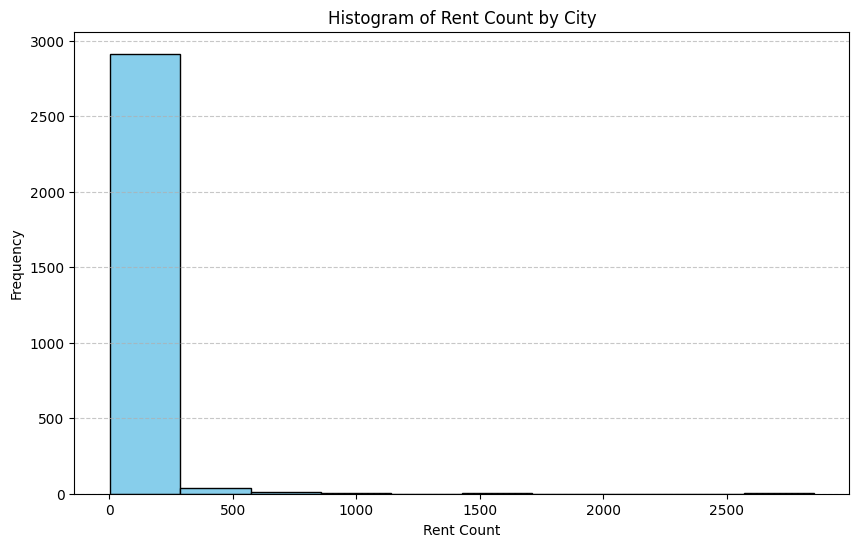

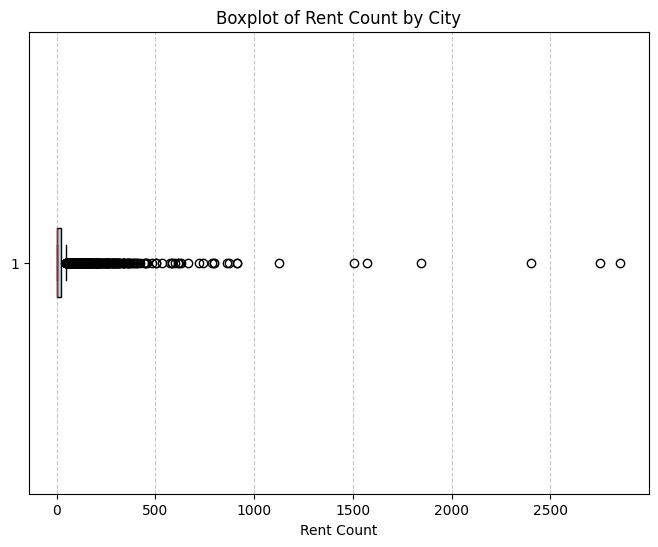

In [41]:
city_rent_counts = data100k['cityname'].value_counts().reset_index()
city_rent_counts.columns = ['cityname', 'rent_count']

plt.figure(figsize=(10, 6))
plt.hist(city_rent_counts['rent_count'], bins=10, color='skyblue', edgecolor='black')
plt.title('Histogram of Rent Count by City')
plt.xlabel('Rent Count')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
plt.figure(figsize=(8, 6))
plt.boxplot(city_rent_counts['rent_count'], vert=False, patch_artist=True,
            boxprops=dict(facecolor='lightblue', color='black'),
            whiskerprops=dict(color='black'), capprops=dict(color='black'),
            medianprops=dict(color='red'))
plt.title('Boxplot of Rent Count by City')
plt.xlabel('Rent Count')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [42]:
def classify_rent_count_custom(count):
    if count > 500:
        return 'Lớn'
    elif count >= 100:
        return 'Trung bình'
    else:
        return 'Thấp'
city_rent_counts['citysize'] = city_rent_counts['rent_count'].apply(classify_rent_count_custom)
data100k = data100k.merge(city_rent_counts[['cityname', 'citysize']], on='cityname', how='left')

In [43]:
data100k['citysize'].value_counts()

,count
citysize,
Trung bình,38466
Thấp,32935
Lớn,27876


In [44]:
data100k['source'].value_counts()

,count
source,
RentDigs.com,90783
RentLingo,6881
ListedBuy,560
GoSection8,434
RealRentals,268
tenantcloud,121
BostonApartments,93
RENTCafé,41
Listanza,25


In [45]:
data100k.loc[(data100k['source']!='RentDigs.com') & (data100k['source'] != 'RentLingo'), 'source'] = 'others'

In [46]:
data100k['time']
data100k['date'] = pd.to_datetime(data100k['time'], unit='s')
print(data100k['date'])

0       2019-12-26 11:39:15
1       2019-12-26 11:39:00
2       2019-12-26 11:38:52
3       2019-12-26 11:38:50
4       2019-12-26 11:38:28
                ...        
99272   2018-12-07 12:29:30
99273   2018-12-07 12:29:10
99274   2018-12-07 12:28:49
99275   2018-12-07 12:27:50
99276   2018-12-07 12:27:39
Name: date, Length: 99277, dtype: datetime64[ns]


In [47]:
data100k['year'] = data100k['date'].dt.year
data100k['month'] = data100k['date'].dt.month
data100k['day'] = data100k['date'].dt.day

data100k.drop(['date','time'], axis=1, inplace=True)

In [48]:
data100k.to_csv('/content/drive/MyDrive/PythonForDataScience/data_processced.csv', index=False)

#IV.Phân tích bằng trực quan hóa

In [49]:
data= pd.read_csv('/content/drive/MyDrive/PythonForDataScience/data_processced.csv')

Phân tích mối quan hệ giữa giá nhà và diện tích

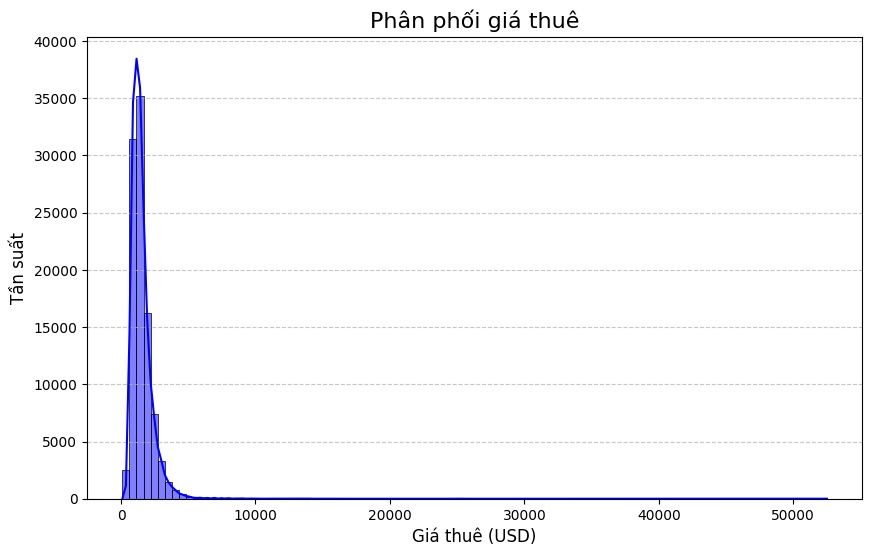

In [50]:
plt.figure(figsize=(10, 6))
sns.histplot(data['price'], kde=True, bins=100, color='blue')
plt.title('Phân phối giá thuê', fontsize=16)
plt.xlabel('Giá thuê (USD)', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

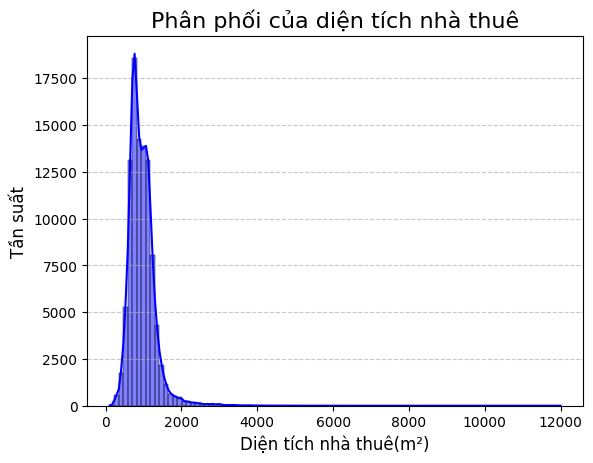

In [51]:
sns.histplot(data['square_feet'], kde=True, bins=100, color='blue')
plt.title('Phân phối của diện tích nhà thuê', fontsize=16)
plt.xlabel('Diện tích nhà thuê(m²)', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [52]:
data['price/square_feet'] = data['price'] / data['square_feet']

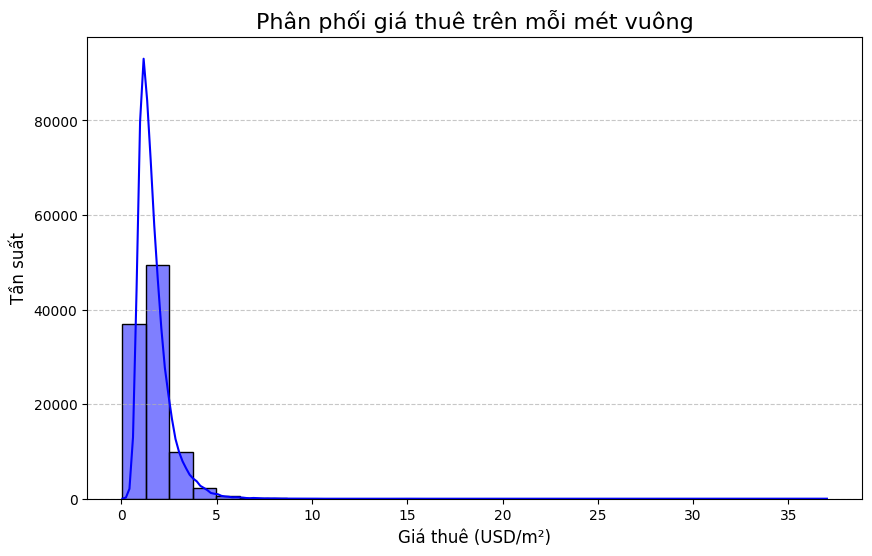

In [53]:
plt.figure(figsize=(10, 6))
sns.histplot(data['price/square_feet'], kde=True, bins=30, color='blue')
plt.title('Phân phối giá thuê trên mỗi mét vuông', fontsize=16)
plt.xlabel('Giá thuê (USD/m²)', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

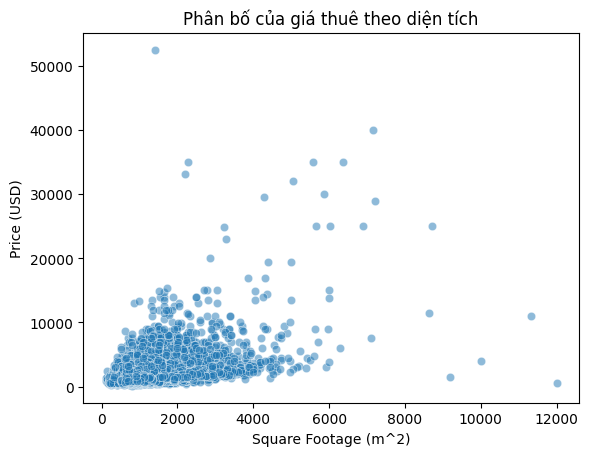

In [54]:
sns.scatterplot(data=data, x='square_feet', y='price', alpha=0.5)
plt.title('Phân bố của giá thuê theo diện tích')
plt.xlabel('Square Footage (m^2)')
plt.ylabel('Price (USD)')
plt.show()

Biểu đồ được fit theo dữ liệu song giá trị ngoại lai quá lớn nên không quan sát được gì nên ta tiến hành loại bỏ dữ liệu ngoại lai có thế giải thích được.

In [55]:
from scipy.stats import zscore
data['z_score'] = zscore(data['price/square_feet'])
data_clean = data[(data['z_score'] > -3) & (data['z_score'] < 3)]
data_clean.drop(columns=['z_score'])

,amenities,bathrooms,bedrooms,has_photo,pets_allowed,price,square_feet,cityname,state,latitude,longitude,source,region,citysize,year,month,day,price/square_feet
0,no_have,1.0,1.0,Thumbnail,yes,2195.0,542,Redondo Beach,CA,33.8520,-118.3759,RentLingo,giapbien,Thấp,2019,12,26,4.049815
1,no_have,1.5,3.0,Thumbnail,yes,1250.0,1500,Newport News,VA,37.0867,-76.4941,RentLingo,giapbien,Trung bình,2019,12,26,0.833333
2,no_have,2.0,3.0,Thumbnail,no,1395.0,1650,Raleigh,NC,35.8230,-78.6438,RentLingo,giapbien,Lớn,2019,12,26,0.845455
3,no_have,1.0,2.0,Thumbnail,yes,1600.0,820,Vacaville,CA,38.3622,-121.9712,RentLingo,giapbien,Thấp,2019,12,26,1.951220
4,no_have,1.0,1.0,Thumbnail,yes,975.0,624,Albuquerque,NM,35.1038,-106.6110,RentLingo,kogiapbien,Thấp,2019,12,26,1.562500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99272,full_basic,1.0,1.0,Yes,no,780.0,605,Houston,TX,29.6151,-95.1998,RentDigs.com,giapbien,Lớn,2018,12,7,1.289256
99273,full_basic,2.0,2.0,Yes,yes,813.0,921,Jacksonville,FL,30.2254,-81.7579,RentDigs.com,giapbien,Trung bình,2018,12,7,0.882736
99274,luxury,1.0,1.0,Yes,yes,1325.0,650,San Diego,CA,32.7379,-117.0914,RentDigs.com,giapbien,Lớn,2018,12,7,2.038462
99275,basic,1.0,1.0,Yes,yes,931.0,701,Huntersville,NC,35.4158,-80.8451,RentDigs.com,giapbien,Thấp,2018,12,7,1.328103


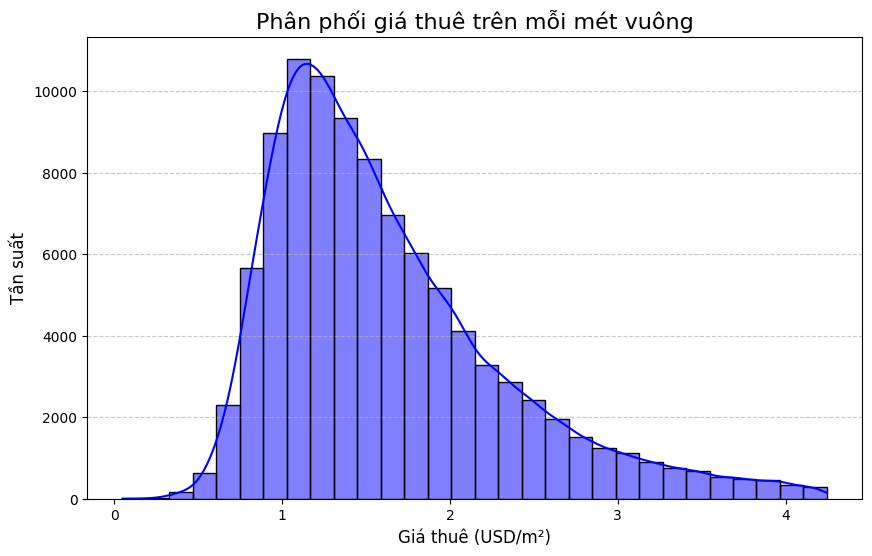

In [56]:
plt.figure(figsize=(10, 6))
sns.histplot(data_clean['price/square_feet'], kde=True, bins=30, color='blue')
plt.title('Phân phối giá thuê trên mỗi mét vuông', fontsize=16)
plt.xlabel('Giá thuê (USD/m²)', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()






- Biểu đồ có dạng lệch phải . Điều này có nghĩa là phần lớn các căn hộ có giá thuê trung bình trong khoảng 1–2 USD/m², nhưng vẫn tồn tại một số căn hộ có giá rất cao, gây ra đuôi dài về bên phải.
- Đỉnh cao nhất của phân phối rơi vào khoảng giá 1 USD/m². Đây là mức giá thuê phổ biến nhất trên mỗi mét vuông, đại diện cho phần lớn căn hộ trong dữ liệu.
- Giá thuê dao động trong khoảng từ 0 đến hơn 4 USD/m².
- Phần lớn các giá thuê tập trung dưới 2.5 USD/m², với tần suất giảm dần khi giá tăng lên.
- Tần suất cao nhất rơi vào khoảng từ 0.8–1.2 USD/m², với trên 10,000 căn hộ thuộc mức giá này.
- Tần suất giảm đáng kể khi giá vượt mức 2 USD/m².


Phân tích giá thuê, giá thuê trên mét vuông theo bang và số lượt thuê

In [57]:
state_counts = data['state'].value_counts().reset_index()

state_counts.columns = ['state', 'count']

fig = px.choropleth(
    state_counts,
    locations='state',
    locationmode='USA-states',
    color='count',
    scope='usa',
    color_continuous_scale='speed',
    labels={'count': 'Số lượt thuê'},
    title='Số lượt thuê theo bang',
    hover_data={'count': True}
)
fig.show()

In [58]:
state_toltal_price = data.groupby('state')['price'].sum().reset_index()

state_toltal_price.columns = ['state', 'tol_price']

fig = px.choropleth(
    state_toltal_price,
    locations='state',
    locationmode='USA-states',
    color='tol_price',
    scope='usa',
    color_continuous_scale='ylgnbu',
    labels={'tol_price': 'Tổng giá thuê(USD)'},
    title='Tổng giá thuê(USD) mỗi bang',
    hover_data={'tol_price': True}
)

fig.show()

In [59]:
state_avg_price = data.groupby('state')['price'].mean().reset_index()
state_avg_price.columns = ['state', 'avg_price']
fig = px.choropleth(
    state_avg_price,
    locations='state',
    locationmode='USA-states',
    color='avg_price',
    scope='usa',
    color_continuous_scale='speed',
    labels={'avg_price': 'Trung bình giá thuê (USD)'},
    title='Trung bình giá thuê mỗi bang (USD)',
    hover_data={'avg_price': True}
)

fig.show()

In [60]:
state_square = data.groupby('state')['square_feet'].mean().reset_index()
state_square.columns = ['state', 'toltal_square']

fig = px.choropleth(
    state_square,
    locations='state',
    locationmode='USA-states',
    color='toltal_square',
    scope='usa',
    color_continuous_scale='speed',
    labels={'toltal_square': 'Diện tích (m^2)'},
    title='Trung bình diện tích đất cho thuê mỗi bang (USD)',
    hover_data={'toltal_square': True}
)

fig.show()

In [61]:
state_priceonsquare = data.groupby('state')['price/square_feet'].mean().reset_index()
state_priceonsquare.columns = ['state', 'avg_priceonsquare']

fig = px.choropleth(
    state_priceonsquare,
    locations='state',
    locationmode='USA-states',
    color='avg_priceonsquare',
    scope='usa',
    color_continuous_scale='speed',
    labels={'avg_priceonsquare': 'Diện tích (m^2)'},
    title='Trung bình giá trên mét vuông thuê mỗi bang (USD/m^2)',
    hover_data={'avg_priceonsquare': True}
)

fig.show()

- Liên hệ giữa vị trí và giá thuê:
+ Những bang như Texas, Florida, và California có số lượt thuê cao, đồng thời cũng có những khu vực gần biển (hoặc tiện ích lớn), điều này có thể dẫn đến giá thuê cao hơn.
+ Khu vực trung tâm hoặc các bang ít lượt thuê (như các bang miền Bắc) có thể tương đồng với khu vực "vùng ngoại ô" trong biểu đồ trước, nơi giá thuê thường thấp hơn.
- Ý nghĩa thực tiễn:
+ Những khu vực trung tâm (hoặc gần biển) có giá thuê cao và số lượt thuê nhiều, thích hợp cho đầu tư bất động sản.
+ Các khu vực ngoại ô hoặc ít lượt thuê có thể là thị trường tiềm năng cho khách hàng có ngân sách hạn chế.

#V.Phân tích bằng học máy và phương pháp thống kê suy diễn

In [11]:
data_model = pd.read_csv('/content/drive/MyDrive/PythonForDataScience/data_processced.csv')
data_model.head()

,amenities,bathrooms,bedrooms,has_photo,pets_allowed,price,square_feet,cityname,state,latitude,longitude,source,region,citysize,year,month,day
0,no_have,1.0,1.0,Thumbnail,yes,2195.0,542,Redondo Beach,CA,33.8520,-118.3759,RentLingo,giapbien,Thấp,2019,12,26
1,no_have,1.5,3.0,Thumbnail,yes,1250.0,1500,Newport News,VA,37.0867,-76.4941,RentLingo,giapbien,Trung bình,2019,12,26
2,no_have,2.0,3.0,Thumbnail,no,1395.0,1650,Raleigh,NC,35.8230,-78.6438,RentLingo,giapbien,Lớn,2019,12,26
3,no_have,1.0,2.0,Thumbnail,yes,1600.0,820,Vacaville,CA,38.3622,-121.9712,RentLingo,giapbien,Thấp,2019,12,26
4,no_have,1.0,1.0,Thumbnail,yes,975.0,624,Albuquerque,NM,35.1038,-106.6110,RentLingo,kogiapbien,Thấp,2019,12,26


In [12]:
data_model.drop(['cityname','state','source','day','month','year'], axis=1, inplace=True)

##1.Thống kê suy diễn

In [64]:
print(data_model.describe())
data_model.describe(include='object')

          bathrooms      bedrooms         price   square_feet      latitude  \
count  99277.000000  99277.000000  99277.000000  99277.000000  99277.000000   
mean       1.445733      1.728497   1527.256666    956.038398     36.947773   
std        0.547015      0.748798    899.492066    365.234825      4.599368   
min        1.000000      0.000000    100.000000    107.000000     19.573800   
25%        1.000000      1.000000   1014.000000    730.000000     33.746500   
50%        1.000000      2.000000   1350.000000    900.000000     37.228200   
75%        2.000000      2.000000   1795.000000   1116.000000     39.953000   
max        9.000000      9.000000  52500.000000  12000.000000     64.833200   

          longitude  
count  99277.000000  
mean     -91.556092  
std       15.810551  
min     -159.369800  
25%     -104.791900  
50%      -84.562300  
75%      -77.606600  
max      -68.778800  


,amenities,has_photo,pets_allowed,region,citysize
count,99277,99277,99277,99277,99277
unique,5,3,2,2,3
top,full_basic,Yes,no,giapbien,Trung bình
freq,29859,55900,60266,69090,38466


In [65]:
categorical_columns = ['amenities', 'has_photo', 'region', 'citysize', 'pets_allowed']
average_price_by_group = {}

for col in categorical_columns:
    average_price_by_group[col] = data_model.groupby(col)['price'].mean()

for col, averages in average_price_by_group.items():
    print(f"Trung bình price theo nhóm của cột '{col}':")
    print(averages, "\n")


Trung bình price theo nhóm của cột 'amenities':
amenities
basic         1603.686886
full_basic    1431.873807
luxury        1632.323421
more_basic    1488.499610
no_have       1573.984964
Name: price, dtype: float64 

Trung bình price theo nhóm của cột 'has_photo':
has_photo
No           1618.595846
Thumbnail    1462.423142
Yes          1551.871395
Name: price, dtype: float64 

Trung bình price theo nhóm của cột 'region':
region
giapbien      1659.342626
kogiapbien    1224.947096
Name: price, dtype: float64 

Trung bình price theo nhóm của cột 'citysize':
citysize
Lớn           1581.075513
Thấp          1544.166540
Trung bình    1473.776166
Name: price, dtype: float64 

Trung bình price theo nhóm của cột 'pets_allowed':
pets_allowed
no     1566.756031
yes    1466.236215
Name: price, dtype: float64 



<ipython-input-66-d4194465e24d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-66-d4194465e24d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-66-d4194465e24d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-66-d4194465e24d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-66-d4194465e24d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be

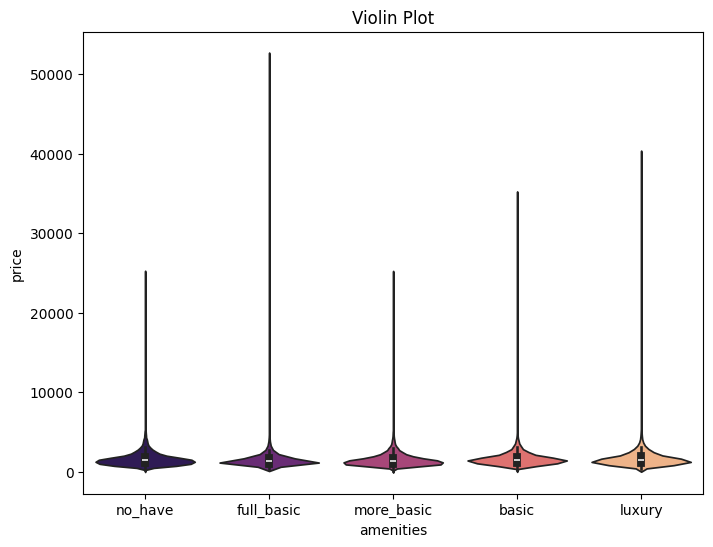

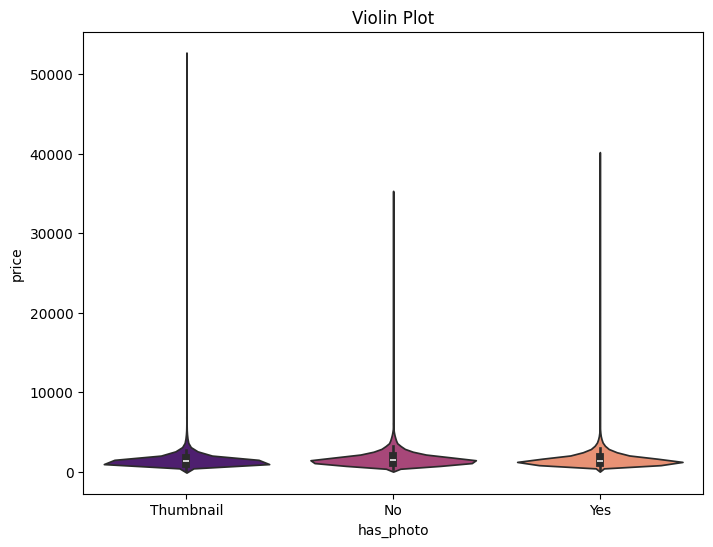

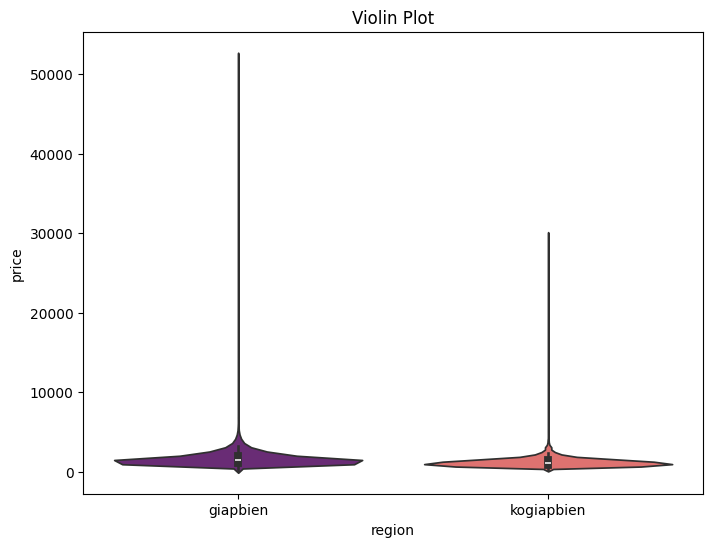

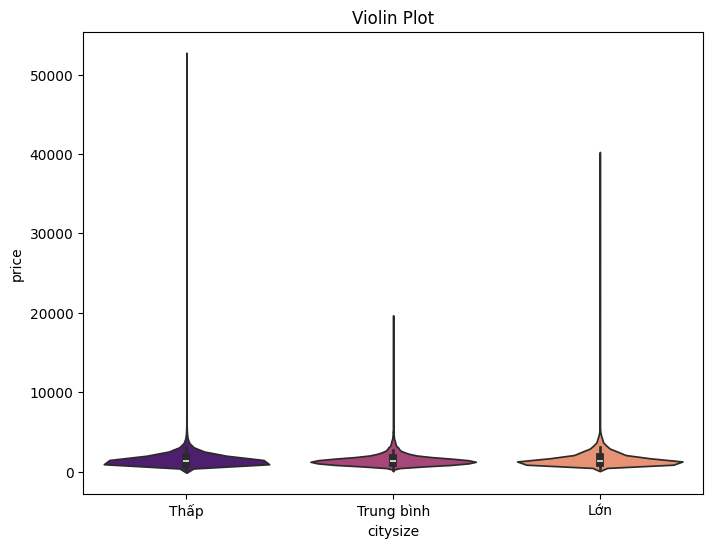

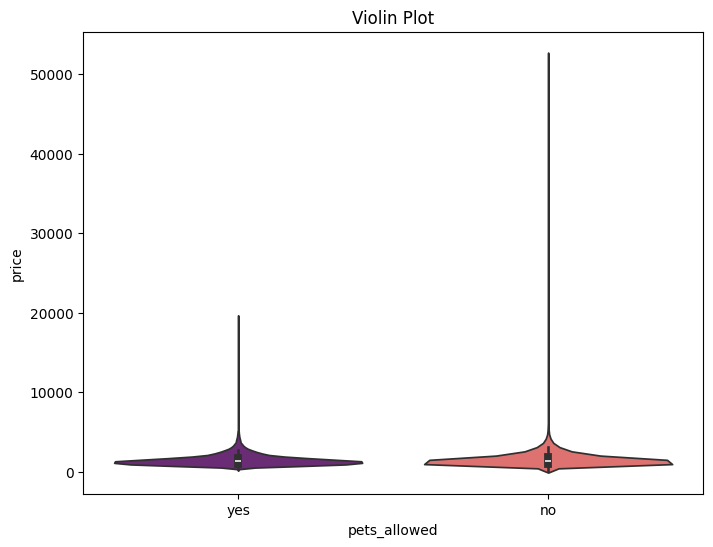

In [66]:
for col in categorical_columns:
  plt.figure(figsize=(8, 6))
  sns.violinplot(x=col, y=data_model['price'], data=data_model, palette='magma')

  plt.title("Violin Plot")
  plt.xlabel(f"{col}")
  plt.ylabel(f"price")

# Hiển thị biểu đồ
plt.show()

dữ liệu có outlier lớn nên ta sẽ log nó xuống để quan sát

<ipython-input-67-a1b4c14aca2c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-67-a1b4c14aca2c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-67-a1b4c14aca2c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-67-a1b4c14aca2c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-67-a1b4c14aca2c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be

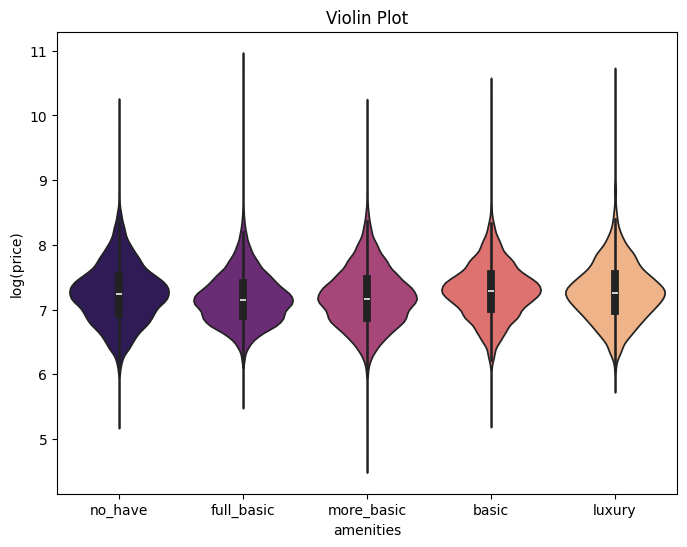

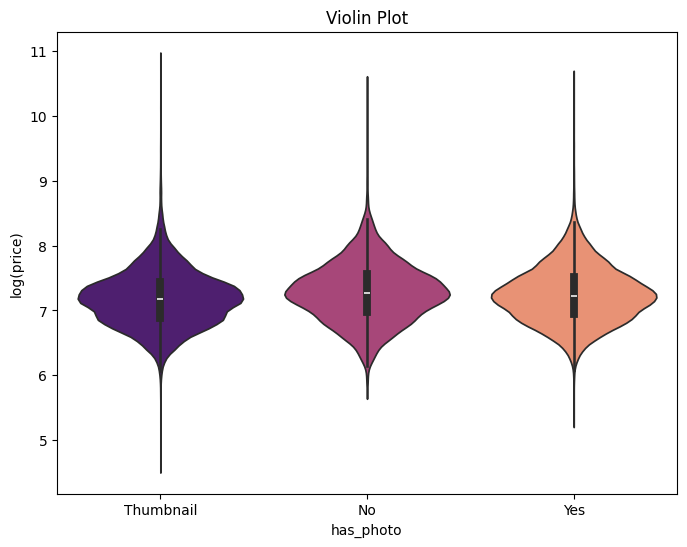

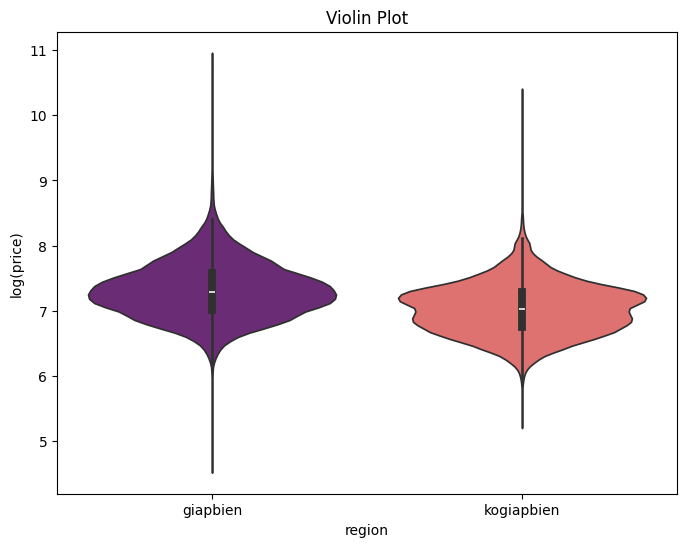

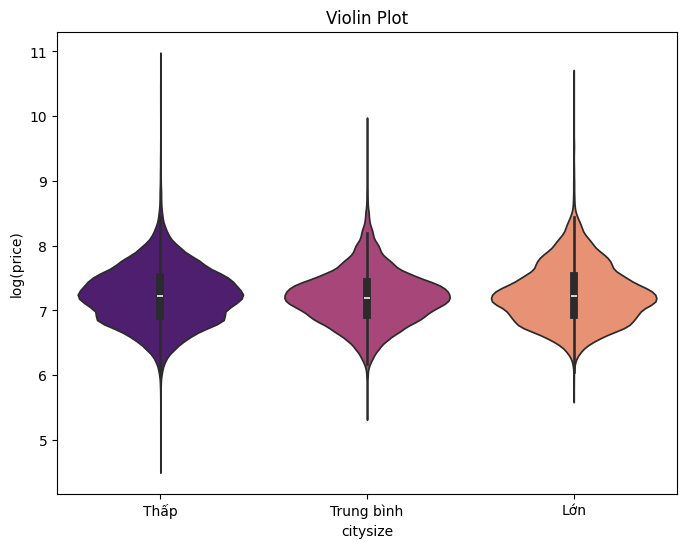

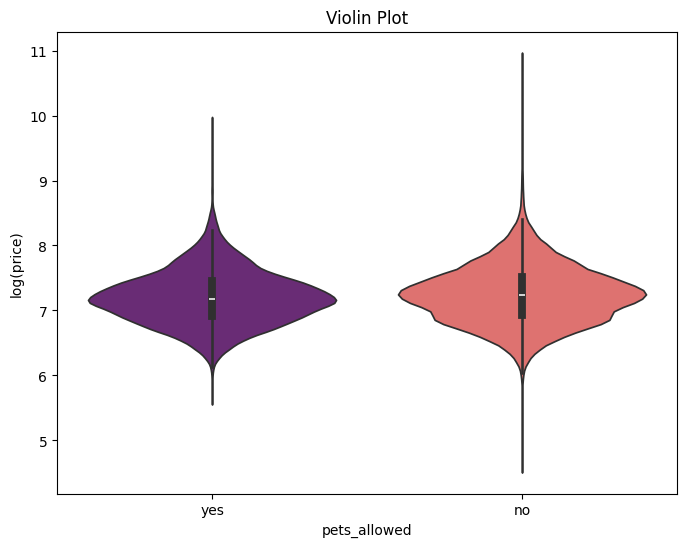

In [67]:
for col in categorical_columns:
  plt.figure(figsize=(8, 6))
  sns.violinplot(x=col, y=np.log(data_model['price']), data=data_model, palette='magma')

  plt.title("Violin Plot")
  plt.xlabel(f"{col}")
  plt.ylabel(f"log(price)")

# Hiển thị biểu đồ
plt.show()

In [68]:
def perm_anova(data, target, groups, n_permutations=1000):

    groups_data = [data[target][data[groups] == group] for group in data[groups].unique()]
    F_obs, _ = f_oneway(*groups_data)
    F_permutations = []

    for _ in range(n_permutations):
        permuted_target = data[target].sample(frac=1, replace=False).reset_index(drop=True)
        permuted_groups_data = [permuted_target[data[groups] == group] for group in data[groups].unique()]
        F_perm, _ = f_oneway(*permuted_groups_data)
        F_permutations.append(F_perm)

    p_value = np.mean([abs(f) > abs(F_obs) for f in F_permutations])

    return F_obs, p_value

In [69]:
results = {}
for col in categorical_columns:
    F_obs, p_value = perm_anova(data_model, 'price', col)
    results[col] = {'F observed': F_obs, 'p-value': p_value}
    print(f'{col} - F observed: {F_obs}, p-value: {p_value}')

amenities - F observed: 186.3925971730592, p-value: 0.0
has_photo - F observed: 157.6298373824902, p-value: 0.0
region - F observed: 5153.937054874712, p-value: 0.0
citysize - F observed: 124.01318603687218, p-value: 0.0
pets_allowed - F observed: 296.62710645304514, p-value: 0.0


In [70]:
def calc_stats(response, group):
    unique_groups = group.unique()
    k = len(unique_groups)
    n = group.value_counts().values
    n_sample = len(response)
    sample_mean = response.mean()

    SSW = sum(response[group == g].var(ddof=1) * (len(response[group == g]) - 1) for g in unique_groups)

    group_means = response.groupby(group).mean().values
    SSB = sum(n[i] * (group_means[i] - sample_mean)**2 for i in range(k))

    MSW = SSW / (n_sample - k)
    MSB = SSB / (k - 1)

    F_sample = MSB / MSW

    return F_sample

def perm_anova(df, response_col, group_col, R):
    response = df[response_col]
    group = df[group_col]

    unique_groups = group.unique()
    k = len(unique_groups)
    n = group.value_counts().values
    n_sample = len(response)


    F_obs = calc_stats(response, group)


    F_perm = np.zeros(R)
    for i in range(R):
        permuted_group = group.sample(frac=1, replace=False).reset_index(drop=True)
        F_perm[i] = calc_stats(response, permuted_group)

    p_value = np.mean(F_perm > F_obs)

    return p_value

In [71]:
results = {}
for col in categorical_columns:
    p_value = perm_anova(data_model, 'price', col,1000)
    results[col] = {'p-value': p_value}
    print(f'{col} - p-value: {p_value}')

amenities - p-value: 0.0
has_photo - p-value: 0.0
region - p-value: 0.0
citysize - p-value: 0.0
pets_allowed - p-value: 0.0


In [72]:
def permutation_test(data, group_col, value_col, n_permutations=1000):

    group1 = data[data[group_col] == data[group_col].unique()[0]][value_col]
    group2 = data[data[group_col] == data[group_col].unique()[1]][value_col]

    observed_diff = abs(group1.mean() - group2.mean())

    perm_diffs = []

    for _ in range(n_permutations):
        permuted_values = data[value_col].sample(frac=1, replace=False).reset_index(drop=True)
        perm_group1 = permuted_values[:len(group1)]
        perm_group2 = permuted_values[len(group1):]
        perm_diff = abs(perm_group1.mean() - perm_group2.mean())
        perm_diffs.append(perm_diff)
    p_value = np.mean([diff > observed_diff for diff in perm_diffs])

    return observed_diff, p_value,data[group_col].unique()[0],data[group_col].unique()[1]

In [73]:
for col in ["region","pets_allowed"]:
    print(permutation_test(data_model, col, 'price'))

(434.39552945989203, 0.0, 'giapbien', 'kogiapbien')
(100.51981600092086, 0.0, 'yes', 'no')


##2.Xây dựng và lựa chọn mô hình

###a)Chuẩn bị dữ liệu để xây  dựng mô hình

In [13]:
label_encoder = LabelEncoder()

for col in ["region","pets_allowed"]:
    if data_model[col].nunique() == 2:
        data_model[col] = label_encoder.fit_transform(data_model[col])
data_model["region"]=1-data_model["region"]
#yes,giapbien

In [14]:
mapping = {"No": 0, "Yes": 1, "Thumbnail": 0.5}
data_model["has_photo"] = data_model["has_photo"].map(mapping)

In [15]:
data_model = pd.get_dummies(data_model, columns=["amenities"], prefix=["amenities"], drop_first=True)

In [16]:
data_model=pd.get_dummies(data_model, columns=["citysize"], drop_first=True)

In [17]:
target = 'price'
data_model = data_model[[target] + [col for col in data_model.columns if col != target]]

<ipython-input-18-52b7c245c9ee>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='index', y='price', data=correlations_series, palette="viridis")


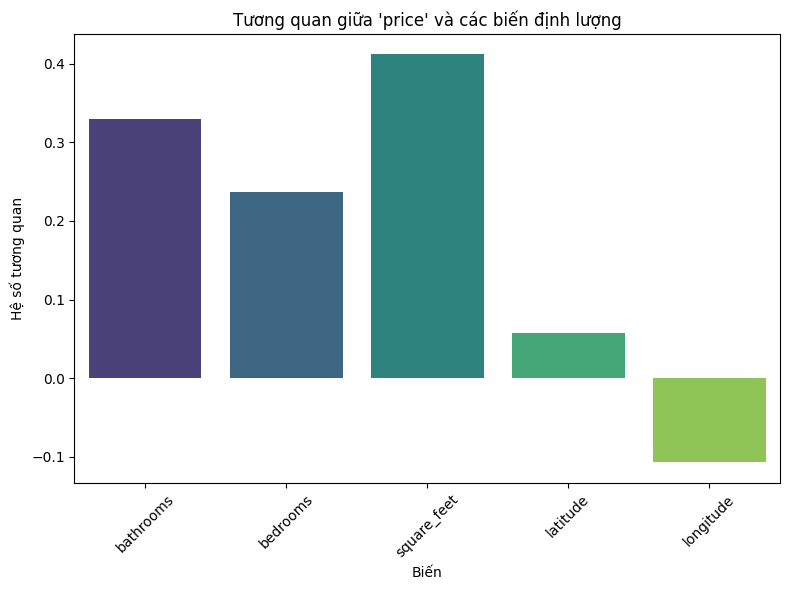

In [18]:
numeric_variables=['price','bathrooms', 'bedrooms','square_feet', 'latitude', 'longitude']
correlations =data_model[numeric_variables].corr()


plt.figure(figsize=(8, 6))
correlations_series = correlations['price'].drop('price').reset_index()
sns.barplot(x='index', y='price', data=correlations_series, palette="viridis")
plt.title(f"Tương quan giữa 'price' và các biến định lượng")
plt.ylabel("Hệ số tương quan")
plt.xlabel("Biến")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

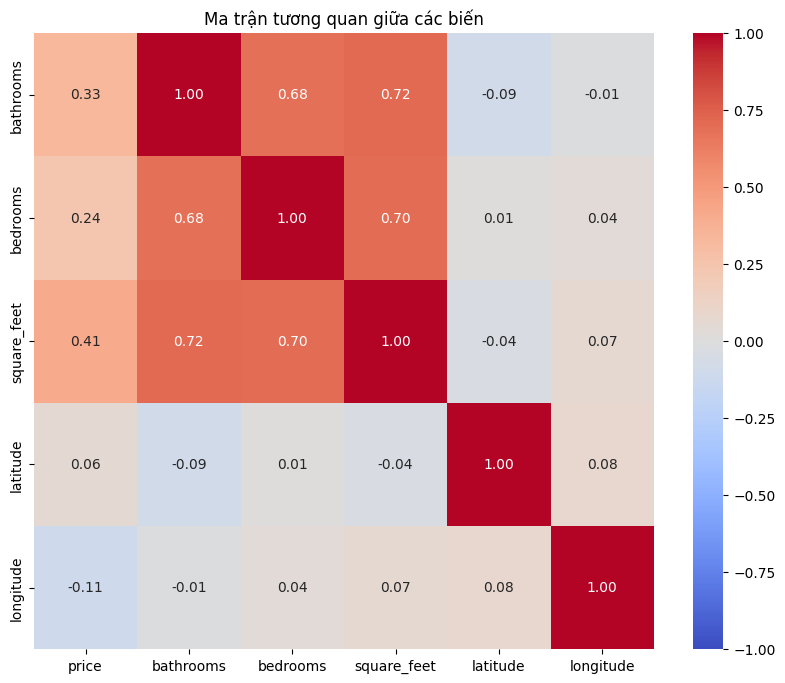

In [19]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlations.drop('price', axis=0), annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title("Ma trận tương quan giữa các biến")
plt.show()

In [20]:
def kiemdinhvif(X,y):
  X = sm.add_constant(data_model.drop("price",axis=1))
  numeric_features = X.select_dtypes(include=np.number).columns
  X = X[numeric_features]
  vif_data = pd.DataFrame()
  vif_data['Feature'] = X.columns
  vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  return vif_data

X,y=data_model.drop("price",axis=1),data_model["price"]
vif_result = kiemdinhvif(X,y)
print(vif_result)

        Feature         VIF
0         const  166.321163
1     bathrooms    2.405338
2      bedrooms    2.275959
3     has_photo    1.002413
4  pets_allowed    1.003524
5   square_feet    2.513592
6      latitude    1.162497
7     longitude    1.094732
8        region    1.201327


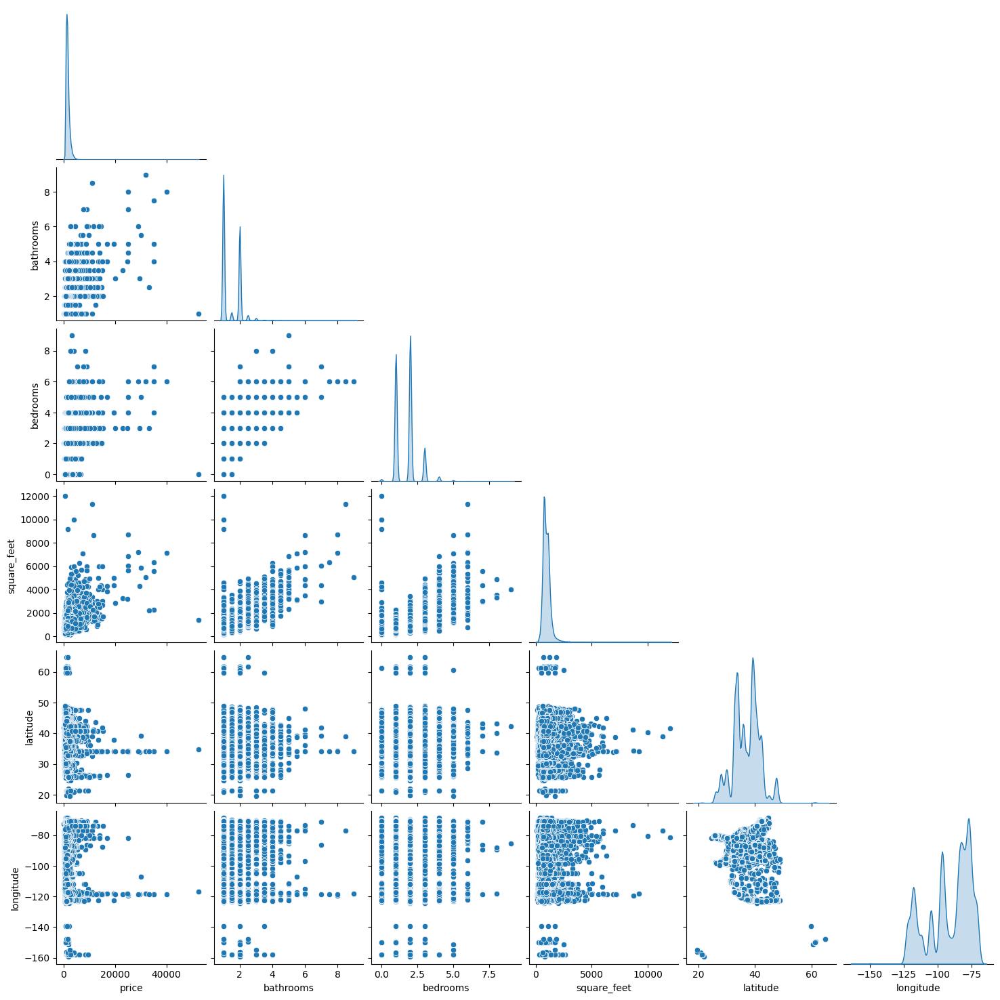

In [21]:
sns.pairplot(data_model[numeric_variables], diag_kind='kde', corner=True)
plt.show()

In [22]:
bool_columns = data_model.select_dtypes(include='bool').columns
data_model[bool_columns] = data_model[bool_columns].astype(int)

###b)Xây dựng mô hình hồi quy tuyến tính

In [23]:
data_model1=data_model
data_model1

,price,bathrooms,bedrooms,has_photo,pets_allowed,square_feet,latitude,longitude,region,amenities_full_basic,amenities_luxury,amenities_more_basic,amenities_no_have,citysize_Thấp,citysize_Trung bình
0,2195.0,1.0,1.0,0.5,1,542,33.8520,-118.3759,1,0,0,0,1,1,0
1,1250.0,1.5,3.0,0.5,1,1500,37.0867,-76.4941,1,0,0,0,1,0,1
2,1395.0,2.0,3.0,0.5,0,1650,35.8230,-78.6438,1,0,0,0,1,0,0
3,1600.0,1.0,2.0,0.5,1,820,38.3622,-121.9712,1,0,0,0,1,1,0
4,975.0,1.0,1.0,0.5,1,624,35.1038,-106.6110,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99272,780.0,1.0,1.0,1.0,0,605,29.6151,-95.1998,1,1,0,0,0,0,0
99273,813.0,2.0,2.0,1.0,1,921,30.2254,-81.7579,1,1,0,0,0,0,1
99274,1325.0,1.0,1.0,1.0,1,650,32.7379,-117.0914,1,0,1,0,0,0,0
99275,931.0,1.0,1.0,1.0,1,701,35.4158,-80.8451,1,0,0,0,0,1,0


In [24]:
X,y = data_model1.drop(columns=['price']),data_model1['price']
X = sm.add_constant(X)

model_ols = sm.OLS(y, X).fit()

print(model_ols.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.307
Model:                            OLS   Adj. R-squared:                  0.307
Method:                 Least Squares   F-statistic:                     3140.
Date:                Wed, 08 Jan 2025   Prob (F-statistic):               0.00
Time:                        03:45:58   Log-Likelihood:            -7.9793e+05
No. Observations:               99277   AIC:                         1.596e+06
Df Residuals:                   99262   BIC:                         1.596e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -2366.7825 

<Figure size 1000x600 with 0 Axes>

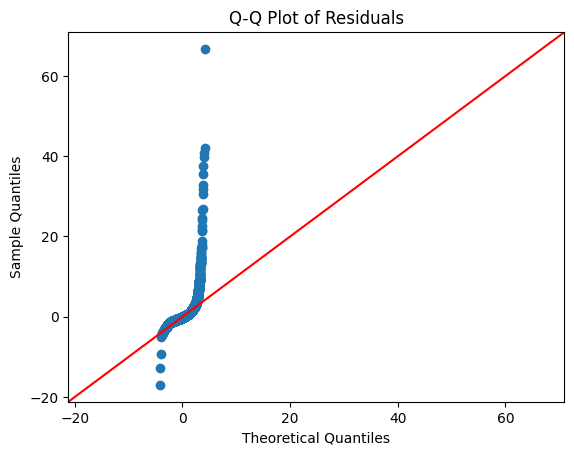

In [25]:
fitted_values = model_ols.fittedvalues
residuals = model_ols.resid

plt.figure(figsize=(10, 6))
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot of Residuals')
plt.show()

In [26]:
from statsmodels.stats.diagnostic import het_breuschpagan

bp_test = het_breuschpagan(residuals, X)
print("Lagrange Multiplier statistic:", bp_test[0])
print("p-value:", bp_test[1])


Lagrange Multiplier statistic: 2482.3569035126843
p-value: 0.0


In [27]:
data_model1.columns = [col.replace(' ', '_') for col in data_model1.columns]

In [28]:
X = data_model1.drop('price', axis= 1)
y = data_model1['price']

bc_result = boxcox(y)
y_boxcox = bc_result[0]
lambda_ = bc_result[1]

sc = StandardScaler()
X = sc.fit_transform(X)

X = sm.add_constant(X)

# Xây dựng mô hình hồi quy tuyến tính
model = sm.OLS(y, X).fit()

# In tóm tắt mô hình
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.307
Model:                            OLS   Adj. R-squared:                  0.307
Method:                 Least Squares   F-statistic:                     3140.
Date:                Wed, 08 Jan 2025   Prob (F-statistic):               0.00
Time:                        03:46:00   Log-Likelihood:            -7.9793e+05
No. Observations:               99277   AIC:                         1.596e+06
Df Residuals:                   99262   BIC:                         1.596e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1527.2567      2.377    642.564      0.0

###c)Xây dựng mô hình phi tuyến

In [29]:
X = data_model.drop('price', axis= 1)
y = data_model['price']

bc_result = boxcox(y)
y_boxcox = bc_result[0]
lambda_ = bc_result[1]

X_train, X_test, y_train, y_test = train_test_split(X, y_boxcox, test_size= 0.2, random_state = 42)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [30]:
models = {
    'gradient boosting' : GradientBoostingRegressor(),
    'random forest' : RandomForestRegressor(),
    'catboost' : CatBoostRegressor(),
    'xgboost' : XGBRegressor(),
}

In [31]:
for name, model in models.items():
    model.fit(X_train, y_train)
    print(f'{name} trained')

gradient boosting trained
random forest trained
Learning rate set to 0.081728
0:	learn: 0.0615117	total: 60.1ms	remaining: 1m
1:	learn: 0.0593535	total: 71.9ms	remaining: 35.9s
2:	learn: 0.0574175	total: 82.8ms	remaining: 27.5s
3:	learn: 0.0556506	total: 93.5ms	remaining: 23.3s
4:	learn: 0.0540914	total: 104ms	remaining: 20.7s
5:	learn: 0.0527686	total: 115ms	remaining: 19s
6:	learn: 0.0515718	total: 143ms	remaining: 20.3s
7:	learn: 0.0505549	total: 154ms	remaining: 19.1s
8:	learn: 0.0496055	total: 164ms	remaining: 18.1s
9:	learn: 0.0485918	total: 175ms	remaining: 17.3s
10:	learn: 0.0478228	total: 185ms	remaining: 16.6s
11:	learn: 0.0469972	total: 195ms	remaining: 16.1s
12:	learn: 0.0462830	total: 206ms	remaining: 15.6s
13:	learn: 0.0457277	total: 217ms	remaining: 15.3s
14:	learn: 0.0452074	total: 228ms	remaining: 15s
15:	learn: 0.0447457	total: 238ms	remaining: 14.7s
16:	learn: 0.0442604	total: 249ms	remaining: 14.4s
17:	learn: 0.0438902	total: 259ms	remaining: 14.1s
18:	learn: 0.0434

In [32]:
results = {}
kf = KFold(n_splits= 10)

for name, model in models.items():
    result = np.mean(np.sqrt(-cross_val_score(model, X_train, y_train, scoring = 'neg_mean_squared_error', cv= kf)))
    results[name] = result

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
4:	learn: 0.0541423	total: 51.6ms	remaining: 10.3s
5:	learn: 0.0527909	total: 61ms	remaining: 10.1s
6:	learn: 0.0516101	total: 70.5ms	remaining: 10s
7:	learn: 0.0505129	total: 82.5ms	remaining: 10.2s
8:	learn: 0.0495933	total: 91.8ms	remaining: 10.1s
9:	learn: 0.0486292	total: 102ms	remaining: 10.1s
10:	learn: 0.0478929	total: 111ms	remaining: 10s
11:	learn: 0.0471938	total: 121ms	remaining: 9.97s
12:	learn: 0.0465689	total: 131ms	remaining: 9.93s
13:	learn: 0.0460179	total: 140ms	remaining: 9.87s
14:	learn: 0.0454760	total: 150ms	remaining: 9.82s
15:	learn: 0.0450056	total: 158ms	remaining: 9.73s
16:	learn: 0.0444995	total: 168ms	remaining: 9.7s
17:	learn: 0.0441222	total: 177ms	remaining: 9.67s
18:	learn: 0.0437074	total: 187ms	remaining: 9.65s
19:	learn: 0.0433769	total: 205ms	remaining: 10s
20:	learn: 0.0430640	total: 214ms	remaining: 9.99s
21:	learn: 0.0427669	total: 224ms	remaining: 9.95s
22:	learn: 0.0425247	total: 233ms	r

In [33]:
for name, result in results.items():
    print(f"{name} : {round(result, 3)}")

gradient boosting : 0.036
random forest : 0.024
catboost : 0.028
xgboost : 0.027


In [34]:
results_df = pd.DataFrame(results, index=range(0,1)).T.rename(columns={0: 'RMSE'}).sort_values('RMSE')

top_3_models = results_df.head(3).index
print("Top 3 models:", top_3_models)

inverse_rmse = {model: 1/results_df.loc[model, 'RMSE'] for model in top_3_models}
total_inverse_rmse = sum(inverse_rmse.values())
weights = {model: inv_rmse/total_inverse_rmse for model, inv_rmse in inverse_rmse.items()}

print("Weights:", weights)

for model_name in top_3_models:
    models[model_name].fit(X_train, y_train)

final_predictions = sum(weights[model] * inv_boxcox(models[model].predict(X_test), lambda_) for model in top_3_models)


rmse = np.sqrt(mean_squared_error(inv_boxcox(y_test, lambda_), final_predictions))
r_squared = r2_score(inv_boxcox(y_test, lambda_), final_predictions)


Top 3 models: Index(['random forest', 'xgboost', 'catboost'], dtype='object')
Weights: {'random forest': 0.3657640429501563, 'xgboost': 0.3213662355411587, 'catboost': 0.3128697215086852}
Learning rate set to 0.081728
0:	learn: 0.0615117	total: 11.5ms	remaining: 11.5s
1:	learn: 0.0593535	total: 22.3ms	remaining: 11.1s
2:	learn: 0.0574175	total: 33ms	remaining: 11s
3:	learn: 0.0556506	total: 43.5ms	remaining: 10.8s
4:	learn: 0.0540914	total: 54.1ms	remaining: 10.8s
5:	learn: 0.0527686	total: 64.9ms	remaining: 10.7s
6:	learn: 0.0515718	total: 75.7ms	remaining: 10.7s
7:	learn: 0.0505549	total: 86ms	remaining: 10.7s
8:	learn: 0.0496055	total: 95.7ms	remaining: 10.5s
9:	learn: 0.0485918	total: 106ms	remaining: 10.5s
10:	learn: 0.0478228	total: 118ms	remaining: 10.6s
11:	learn: 0.0469972	total: 140ms	remaining: 11.5s
12:	learn: 0.0462830	total: 155ms	remaining: 11.8s
13:	learn: 0.0457277	total: 165ms	remaining: 11.6s
14:	learn: 0.0452074	total: 176ms	remaining: 11.5s
15:	learn: 0.0447457	tot

In [35]:
print(f'RMSE: {rmse}')
print(f'R-square: {r_squared}')

RMSE: 433.83313437212666
R-square: 0.7751968890078738


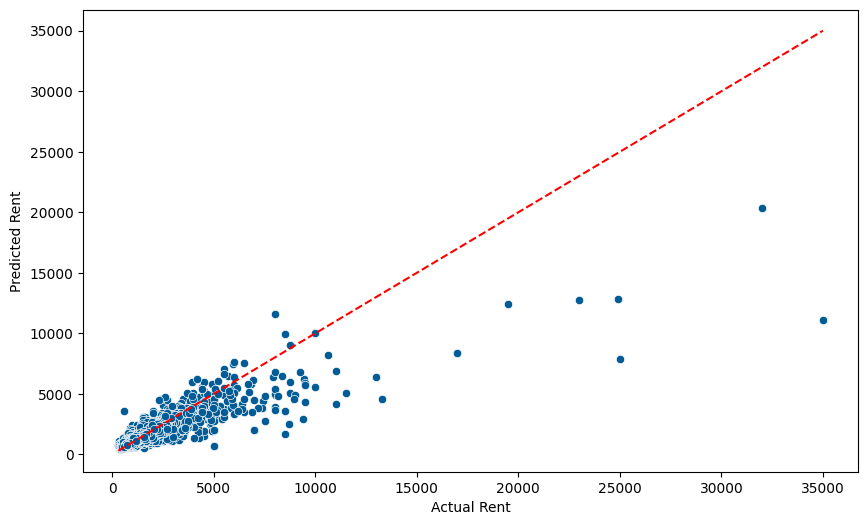

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=inv_boxcox(y_test, lambda_), y=final_predictions, color='#005b96')
plt.xlabel('Actual Rent')
plt.ylabel('Predicted Rent')

min_val = min(inv_boxcox(y_test, lambda_).min(), final_predictions.min())
max_val = max(inv_boxcox(y_test, lambda_).max(), final_predictions.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--')

plt.show()

In [37]:
def ensemble_predict(X):
    predictions = np.zeros(len(X))
    for model_name in top_3_models:
        predictions += weights[model_name] * inv_boxcox(models[model_name].predict(X), lambda_)
    return predictions

explainer = LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=["Target"],
    mode="regression"
)

i = 0
explanation = explainer.explain_instance(
    data_row=X_test[i],
    predict_fn=ensemble_predict
)

explanation.show_in_notebook()

In [38]:
for model_name in top_3_models:
    print(f"\nExplaining model: {model_name}")
    model_predict_fn = lambda X: inv_boxcox(models[model_name].predict(X), lambda_)
    explanation = explainer.explain_instance(
        data_row=X_test[i],
        predict_fn=model_predict_fn
    )
    explanation.show_in_notebook()


Explaining model: random forest



Explaining model: xgboost



Explaining model: catboost


**Kết luận:**

Đặc trưng chi phối: Các đặc trưng như diện tích (square_feet), vị trí địa lý (longitude, latitude), số phòng tắm/ngủ và quy mô thành phố đã được định danh là các yếu tố quan trọng nhất trong việc định giá thuê.

So sánh mô hình: Random Forest cho thấy kết quả cân bằng, trong khi XGBoost đề xu hướng dự đoán cao và CatBoost cung cấp kết quả trung hòa nhất.

**Các đặc trưng quan trọng nhất:**

- square_feet:là đặc trưng quan trọng nhất trong cả 3 mô hình, tỷ lệ thuận với giá thuê.

- longitude (kinh độ) và latitude (vĩ độ):

Các đặc trưng về vị trí địa lý đóng vai trò quan trọng trong việc định giá bất động sản.

Ví dụ, những nhà gần trung tâm hoặc vùng giáp biển thường có giá cao hơn.

- bathrooms và bedrooms:

Số phòng tắm và phòng ngủ đáng kể ảnh hưởng đến dự đoán giá. Nhiều phòng tắm/ngủ hơn dẫn đến giá thuê cao hơn.

- citysize (quy mô thành phố):

Thành phố lớn thường được định giá cao hơn thành phố nhỏ.

Trong hình minh họa, yếu tố "citysize: Thấp" đã góp phần âm vào dự đoán giá thuê.

- has_photo và amenities:

Tin rao có ảnh (đặc biệt là ảnh chất lượng cao) thường được định giá cao hơn.

Các tiện nghi cao cấp như "amenities_luxury" đóng góp tích cực vào giá thuê.